#**UNIVPM - Stefano Perniola**

Modelli per la fall detection sul dataset (Home, Coffee room, Office, Lecture room)

Cartelle totali del Dataset:
- Home_01
- Home_02
- Coffe_room_01
- Coffe_room_02
- Lecture room
- Office

Cartelle senza annotazioni (da usare magari come validation set)
- Lecture_room
- Office

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!du -sh drive/MyDrive/DatasetProf/Home_merged/train
!du -sh drive/MyDrive/DatasetProf/Coffee_merged/train

393M	drive/MyDrive/DatasetProf/Home_merged/train
535M	drive/MyDrive/DatasetProf/Coffee_merged/train


# Unzip Dataset (da eseguire una volta)

Estrae i file .zip dal Drive

In [ ]:
import os
import zipfile

path = "drive/MyDrive/DatasetProf"

for file in os.listdir(path):
  if file.endswith("Archive.zip"):
    print("Estraggo: "+file)
    zip_ref = zipfile.ZipFile(path+"/"+file, 'r')
    zip_ref.extractall(path)
    zip_ref.close()
  #os.remove(prova_path+"/"+file)

Estraggo: Archive.zip


In [ ]:
!ls -l drive/MyDrive/DatasetProf/Coffee_merged/train | grep video | wc -l
!cat drive/MyDrive/DatasetProf/Coffee_merged/train_labels.csv | grep video | wc -l

!ls -l drive/MyDrive/DatasetProf/Home_merged/train | grep video | wc -l
!cat drive/MyDrive/DatasetProf/Home_merged/train_labels.csv | grep video | wc -l

In [ ]:
import os

def convert_avi_to_mp4(avi_file_path, output_name):
    os.popen("ffmpeg -i '{input}' -ac 2 -b:v 2000k -c:a aac -c:v libx264 -b:a 160k -vprofile high -bf 0 -strict experimental -f mp4 '{output}.mp4'".format(input = avi_file_path, output = output_name))
    return True

convert_avi_to_mp4("drive/MyDrive/DatasetProf/video (1).avi","drive/MyDrive/DatasetProf/video1")
convert_avi_to_mp4("drive/MyDrive/DatasetProf/video (2).avi","drive/MyDrive/DatasetProf/video2")
convert_avi_to_mp4("drive/MyDrive/DatasetProf/video (27).avi","drive/MyDrive/DatasetProf/video27")
convert_avi_to_mp4("drive/MyDrive/DatasetProf/video (31).avi","drive/MyDrive/DatasetProf/video31")

True

# Preprocessing: Video to frames (eseguire una volta)

**Determino le categorie da preprocessare**

In [ ]:
categories = ['Office']

**Converto i video in frames (esegue una volta)**

In [ ]:
import os
import cv2
import math 
import glob
import shutil

# Mi sposto sul folder del drive di FallDataset
os.chdir('/content/drive/My Drive/FallDataset')

# Per ogni categoria, creo una cartella testdata
for i in categories: 
  try:
    os.mkdir(os.path.join(str(i),'testdata'))
  except:
    pass
 
# immagini to video
for i in categories:
  print("Categoria: "+i)

  path = str(i) + '/Videos/'
  list = os.listdir(path) 
  numvideos = len(list)
  j = int(list[0].split("(")[1].split(")")[0]) # indice del primo video (es. 31 per Home_02)
 
  if i == 'Lecture_room':
    last_index = 27
  elif i == 'Office':
    last_index = 33
  else:
    last_index = int(list[len(list)-1].split("(")[1].split(")")[0])

  while (j <= last_index):
    print("Writing Video: " + str(j))
    
    try:
      os.mkdir(str(i) + '/testdata' + '/video' + str(j)) # nuova directory per ogni video
    except:
      pass
      
    try:
      vidcap = cv2.VideoCapture(str(i) + '/Videos/' +'video (' + str(j) + ').avi')
      success,image = vidcap.read()
      count = 0
      success = True
      path2 = str(i) + '/testdata' + '/video' + str(j)
      while success:
        cv2.imwrite(os.path.join(path2 , "frame%d.jpg" % count), image)
        success,image = vidcap.read()
        count += 1
    except:
      pass
   
    j+=1
    

# Preparazione Dataset (da eseguire una volta)
- Rinominazione frames 
- Merge frames
- Eliminazione frames non utilizzabili
- Split train, test frames


In [ ]:
categories = ['Coffee_room_02']

Rinomino i frame di ogni video per poterli successivamente unire in un'unica cartella

In [ ]:
import os
data_path = "drive/MyDrive/FallDataset"

In [ ]:
for category in categories:
  folder_path = os.path.join(data_path, category)
  for folder in os.listdir(folder_path+"/testdata/"):
    for frame in os.listdir(folder_path+"/testdata/"+folder):
      if frame.endswith("jpg"):
        os.rename(folder_path+"/testdata/"+folder+"/"+frame,str(folder_path+"/testdata/"+folder+"/"+frame).replace(folder+"_"+folder,folder+"_")) 


FileNotFoundError: ignored

In [ ]:
!ls drive/MyDrive/FallDataset/Coffee_room_02/testdata/video31  | grep frame1.jpg

ls: cannot access 'drive/MyDrive/FallDataset/Coffee_room_02/testdata/video31': No such file or directory


Faccio il merge di tutti i frame

In [ ]:
categories = ['Coffee_room_02']

In [ ]:
for category in categories:
  folder_path = os.path.join(data_path, category)
  for folder in os.listdir(folder_path+"/testdata/"):
    for frame in os.listdir(folder_path+"/testdata/"+folder):
      if frame.endswith("jpg"):
        os.replace(folder_path+"/testdata/"+folder+"/"+frame, folder_path+"/train/"+frame)

In [ ]:
!mv drive/MyDrive/FallDataset/Coffee_room_01/train/* drive/MyDrive/FallDataset/Coffee_room_01_02/train
!mv drive/MyDrive/FallDataset/Coffee_room_02/train/* drive/MyDrive/FallDataset/Coffee_room_01_02/train

Faccio il merge fra Home_01-Home_02 e Coffee_room_01-Coffee_room_02

In [ ]:
!mv drive/MyDrive/FallDataset/Home_01/train/* drive/MyDrive/FallDataset/Home_01_02/train
!mv drive/MyDrive/FallDataset/Home_02/train/* drive/MyDrive/FallDataset/Home_01_02/train

!mv drive/MyDrive/FallDataset/Coffee_room_01/train/* drive/MyDrive/FallDataset/Coffee_room_01_02/train
!mv drive/MyDrive/FallDataset/Coffee_room_02/train/* drive/MyDrive/FallDataset/Coffee_room_01_02/train

!mv drive/MyDrive/FallDataset/Home_01/test/* drive/MyDrive/FallDataset/Home_01_02/test
!mv drive/MyDrive/FallDataset/Coffee_room_01/test/* drive/MyDrive/FallDataset/Coffee_room_01_02/test

mv: cannot stat 'drive/MyDrive/FallDataset/Home_01/train/*': No such file or directory
mv: cannot stat 'drive/MyDrive/FallDataset/Home_02/train/*': No such file or directory
mv: cannot stat 'drive/MyDrive/FallDataset/Coffee_room_01/train/*': No such file or directory
mv: cannot stat 'drive/MyDrive/FallDataset/Home_01/test/*': No such file or directory
mv: cannot stat 'drive/MyDrive/FallDataset/Coffee_room_01/test/*': No such file or directory


In [ ]:
import pandas as pd
import os

data1 = "drive/MyDrive/FallDataset/Home_01_02/"
data2 = "drive/MyDrive/FallDataset/Coffee_room_01_02/"

train_home = len([entry for entry in os.listdir(data1+"train") if os.path.isfile(os.path.join(data1+"train", entry))])
train_coffee = len([entry for entry in os.listdir(data2+"train") if os.path.isfile(os.path.join(data2+"train", entry))])
test_home = len([entry for entry in os.listdir(data1+"test") if os.path.isfile(os.path.join(data1+"test", entry))])
test_coffee = len([entry for entry in os.listdir(data2+"test") if os.path.isfile(os.path.join(data2+"test", entry))])
  
tlh = len(pd.read_csv(data1+'train_labels.csv'))
ttlh = len(pd.read_csv(data1+'test_labels.csv'))
tlc = len(pd.read_csv(data2+'train_labels.csv'))
ttlc = len(pd.read_csv(data2+'test_labels.csv'))


print("Train labels,images Home: " +str(tlh),train_home)
print("Test labels,images Home: "+str(ttlh),test_home)
print("Train labels,images Coffee: "+str(tlc),train_coffee)
print("Test labels,images Coffee: "+str(ttlc),test_coffee)

Train labels,images Home: 14034 14034
Test labels,images Home: 463 463
Train labels,images Coffee: 24662 3161
Test labels,images Coffee: 738 738


Droppo i video con cadute ma senza annotazioni (50 e 52 di Coffee_room_02)

In [ ]:
for frame in os.listdir("drive/MyDrive/FallDataset/Coffee_room_01_02/train"):
  if ('video50_' in frame) or ('video52_' in frame) or ('video6_' in frame) or ('video68_' in frame):
    os.remove("drive/MyDrive/FallDataset/Coffee_room_01_02/train/"+frame)

Splitto i frames in train e test

In [ ]:
import os
data_path = "drive/MyDrive/FallDataset"

categories = ['Home_01','Coffee_room_01']

for category in categories:
  new_path = os.path.join(data_path,category)
  for file in os.listdir(new_path+"/train"):
    if 'video29_' in file or 'video30_' in file:
      os.replace(new_path+"/train/"+file, new_path+"/test/"+file)

# Verifico matching images->labels

In [ ]:
''' scrive su file di testo i nomi di tutte le immagini
f = open("drive/MyDrive/FallDataset/Home_01_02/newtrain_home.txt", "w")
for file in os.listdir("drive/MyDrive/FallDataset/Home_01_02/train"):
  f.write(file)
  f.write("\n")
f.close()

g = open("drive/MyDrive/FallDataset/Coffee_room_01_02/newtrain_coff.txt", "w")
for file in os.listdir("drive/MyDrive/FallDataset/Coffee_room_01_02/train"):
  g.write(file)
  g.write("\n")
g.close()
'''

In [ ]:

import csv
import os

print("Home")
for i in range(0,61): 
  count = 0
  labels = 0
  for image in os.listdir("drive/MyDrive/DatasetProf/Home_merged/train"):
    if 'video'+str(i) in image:
      count += 1

  with open('drive/MyDrive/DatasetProf/Home_merged/train_labels.csv') as file_obj:
    reader_obj = csv.reader(file_obj)
    for row in reader_obj: 
        if 'video'+str(i) in row[0]:
          labels += 1

  if count == labels:
    print(str(i), "ok")
  else:
    print(str(i),str(count),str(labels))
    

In [ ]:
import csv
import os

print("Coffee")
for i in range(0,71): 
  count = 0
  labels = 0
  for image in os.listdir("drive/MyDrive/DatasetProf/Coffee_merged/train"):
    if 'video'+str(i) in image:
      count += 1

  with open('drive/MyDrive/DatasetProf/Coffee_merged/train_labels.csv') as file_obj:
    reader_obj = csv.reader(file_obj)
    for row in reader_obj: 
        if 'video'+str(i) in row[0]:
          labels += 1

  if count == labels:
    print(str(i), "ok")
  else:
    print(str(i),str(count),str(labels))

Coffee
0 ok
1 ok
2 ok
3 ok
4 ok
5 ok
6 ok
7 ok
8 ok
9 ok
10 ok
11 ok
12 ok
13 ok
14 ok
15 ok
16 ok
17 ok
18 ok
19 ok
20 ok
21 ok
22 ok
23 ok
24 ok
25 ok
26 ok
27 ok
28 ok
29 ok
30 ok
31 ok
32 ok
33 ok
34 ok
35 ok
36 ok
37 ok
38 ok
39 ok
40 ok
41 ok
42 ok
43 ok
44 ok
45 ok
46 ok
47 ok
48 ok
49 ok
50 ok
51 ok
52 ok
53 ok
54 ok
55 ok
56 ok
57 ok
58 ok
59 ok
60 ok
61 ok
62 ok
63 ok
64 ok
65 ok
66 ok
67 ok
68 ok
69 ok
70 ok


# **Train & Test Data**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import os
import keras

In [ ]:
data_path = "drive/MyDrive/DatasetProf/Home_merged"
data_path2 = "drive/MyDrive/DatasetProf/Coffee_merged"
data_path3 = "drive/MyDrive/UR-Fall-Dataset-cam0-rgb-adl"
data_path4 = "drive/MyDrive/DatasetProf/Lecture_room" # 2 video
data_path5 = "drive/MyDrive/DatasetProf/Office" # 1 video

In [ ]:
def read_dataset(path,delimiter):
  df = pd.read_csv(path,sep=delimiter,index_col='images')
  df = df.dropna()
  return df

In [ ]:
# Home
df_train = read_dataset(data_path+'/train_labels.csv',delimiter=";")
print(df_train.shape)

# Coffee room
df_train2 = read_dataset(data_path2+'/train_labels.csv',delimiter=",")
print(df_train2.shape)

# UR - cam0
df_train3 = read_dataset(data_path3+'/train_labels.csv',delimiter=";")
print(df_train3.shape)

# Lecture room
df_train4 = read_dataset(data_path4+'/train_labels.csv',delimiter=",")
print(df_train3.shape)

# Office
df_train5 = read_dataset(data_path5+'/train_labels.csv',delimiter=",")
print(df_train3.shape)

(13508, 1)
(21022, 1)
(2827, 1)
(2827, 1)
(2827, 1)


In [ ]:
# Home
test_df = read_dataset(data_path+'/test_labels.csv',delimiter=",")
print(test_df.shape)

# Coffee room
test_df2 = read_dataset(data_path2+'/test_labels.csv',delimiter=",")
print(test_df2.shape)

# UR - cam0
test_df3 = read_dataset(data_path3+'/test_labels.csv',delimiter=",")
print(test_df3.shape)

(991, 1)
(2901, 1)
(181, 1)


In [ ]:
!ls -l drive/MyDrive/DatasetProf/Home_merged/train/ | grep video | wc -l
!ls -l drive/MyDrive/DatasetProf/Coffee_merged/train/ | grep video | wc -l
!ls -l drive/MyDrive/UR-Fall-Dataset-cam0-rgb-adl/train_images/ | grep cam0 | wc -l

13508
21022
2826


In [ ]:
!cat drive/MyDrive/DatasetProf/Home_merged/train_labels.csv | grep video | wc -l
!cat drive/MyDrive/DatasetProf/Coffee_merged/train_labels.csv | grep video | wc -l
!cat drive/MyDrive/UR-Fall-Dataset-cam0-rgb-adl/train_labels.csv | grep cam0 | wc -l

13508
21022
2826


# Images to npArray

In [ ]:
def stack_data(dataset_folder,df_train,test_df,fx=96,fy=96):
  train_images = []
  train_labels = []
  test_images = []
  test_labels = []

  for folder in os.listdir(dataset_folder):
      folder_path = os.path.join(dataset_folder, folder)
      if folder == 'train' or folder == 'train_images':
          for file in os.listdir(folder_path):
              if file.endswith('jpg'):
                  try:
                    img_path = os.path.join(folder_path, file)
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, (fx,fy))
                    train_images.append(img)
                    train_labels.append(df_train.loc[file, 'labels'])
                  except:
                    print("File: "+file)
  
      elif folder == 'test' or folder == 'test_images':
          for file in os.listdir(folder_path):
              if file.endswith('jpg'):
                  try:
                    img_path = os.path.join(folder_path, file)
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, (fx,fy))
                    test_images.append(img)
                    test_labels.append(test_df.loc[file, 'labels'])
                  except:
                    print("File: "+file)
      else:
          pass
          
  train_images = np.array(train_images)
  train_labels = np.array(train_labels)

  if test_images is not None and test_labels is not None:
    test_images = np.array(test_images)
    test_labels = np.array(test_labels)
  
  print('Shape of stacked train images:', train_images.shape)
  print('Shape of train labels:', train_labels.shape)

  if test_images is not None and test_labels is not None:
    print('Shape of stacked test images:', test_images.shape)
    print('Shape of test labels:', test_labels.shape)
  
  if test_images is not None and test_labels is not None:
    return train_images, train_labels,test_images,test_labels
  else:
    return train_images, train_labels

In [ ]:
print("Home:")
train_images,train_labels,test_images,test_labels = stack_data(data_path,df_train,test_df,fx=128,fy=96)
print("Coffee:")
train_images2,train_labels2,test_images2,test_labels2 = stack_data(data_path2,df_train2,test_df2,fx=128,fy=96)
print("Cam0:")
train_images3,train_labels3,test_images3,test_labels3 = stack_data(data_path3,df_train3,test_df3,fx=128,fy=96)
print("Lecture room:")
train_images4,train_labels4,test_images4,test_labels4 = stack_data(data_path4,df_train4,None,fx=128,fy=96)
print("Office")
train_images5,train_labels5,test_images5,test_labels5 = stack_data(data_path5,df_train5,None,fx=128,fy=96)

Home:
Shape of stacked train images: (13508, 96, 128, 3)
Shape of train labels: (13508,)
Shape of stacked test images: (991, 96, 128, 3)
Shape of test labels: (991,)
Coffee:
Shape of stacked train images: (21022, 96, 128, 3)
Shape of train labels: (21022,)
Shape of stacked test images: (2901, 96, 128, 3)
Shape of test labels: (2901,)
Cam0:
Shape of stacked train images: (2826, 96, 128, 3)
Shape of train labels: (2826,)
Shape of stacked test images: (169, 96, 128, 3)
Shape of test labels: (169,)
Lecture room:
Shape of stacked train images: (791, 96, 128, 3)
Shape of train labels: (791,)
Shape of stacked test images: (0,)
Shape of test labels: (0,)
Office
Shape of stacked train images: (415, 96, 128, 3)
Shape of train labels: (415,)
Shape of stacked test images: (0,)
Shape of test labels: (0,)


In [ ]:
# Salvo i dati processati (np array) su file (eseguire una volta) [160x120]

from numpy import asarray
from numpy import savetxt

#home
np.save('drive/MyDrive/DatasetProf/Arrays/train_images.npy', train_images)
np.save('drive/MyDrive/DatasetProf/Arrays/train_labels.npy', train_labels)
np.save('drive/MyDrive/DatasetProf/Arrays/test_images.npy', test_images)
np.save('drive/MyDrive/DatasetProf/Arrays/test_labels.npy', test_labels)

#coffee
np.save('drive/MyDrive/DatasetProf/Arrays/train_images2.npy', train_images2)
np.save('drive/MyDrive/DatasetProf/Arrays/train_labels2.npy', train_labels2)
np.save('drive/MyDrive/DatasetProf/Arrays/test_images2.npy', test_images2)
np.save('drive/MyDrive/DatasetProf/Arrays/test_labels2.npy', test_labels2)

#cam0
np.save('drive/MyDrive/DatasetProf/Arrays/train_images3.npy', train_images3)
np.save('drive/MyDrive/DatasetProf/Arrays/train_labels3.npy', train_labels3)
np.save('drive/MyDrive/DatasetProf/Arrays/test_images3.npy', test_images3)
np.save('drive/MyDrive/DatasetProf/Arrays/test_labels3.npy', test_labels3)

#lecture room
np.save('drive/MyDrive/DatasetProf/Arrays/train_images4.npy', train_images4)
np.save('drive/MyDrive/DatasetProf/Arrays/train_labels4.npy', train_labels4)
#np.save('drive/MyDrive/DatasetProf/Arrays/test_images3.npy', test_images4)
#np.save('drive/MyDrive/DatasetProf/Arrays/test_labels3.npy', test_labels4)

#office
np.save('drive/MyDrive/DatasetProf/Arrays/train_images5.npy', train_images5)
np.save('drive/MyDrive/DatasetProf/Arrays/train_labels5.npy', train_labels5)
#np.save('drive/MyDrive/DatasetProf/Arrays/test_images5.npy', test_images5)
#np.save('drive/MyDrive/DatasetProf/Arrays/test_labels5.npy', test_labels5)

In [ ]:
# load numpy array 
from numpy import loadtxt

#home
train_images = np.load('drive/MyDrive/DatasetProf/Arrays/train_images.npy')
train_labels = np.load('drive/MyDrive/DatasetProf/Arrays/train_labels.npy')
test_images = np.load('drive/MyDrive/DatasetProf/Arrays/test_images.npy')
test_labels = np.load('drive/MyDrive/DatasetProf/Arrays/test_labels.npy')

#coffee
train_images2 = np.load('drive/MyDrive/DatasetProf/Arrays/train_images2.npy')
train_labels2 = np.load('drive/MyDrive/DatasetProf/Arrays/train_labels2.npy')
test_images2 = np.load('drive/MyDrive/DatasetProf/Arrays/test_images2.npy')
test_labels2 = np.load('drive/MyDrive/DatasetProf/Arrays/test_labels2.npy')

#cam0
train_images3 = np.load('drive/MyDrive/DatasetProf/Arrays/train_images3.npy')
train_labels3 = np.load('drive/MyDrive/DatasetProf/Arrays/train_labels3.npy')
test_images3 = np.load('drive/MyDrive/DatasetProf/Arrays/test_images3.npy')
test_labels3 = np.load('drive/MyDrive/DatasetProf/Arrays/test_labels3.npy')

Split dei dati

In [ ]:
from sklearn.model_selection import train_test_split

# Home
X_train, X_val, y_train, y_val = train_test_split(train_images, train_labels, stratify=train_labels, test_size=0.1)

# Coffee_room
X_train2, X_val2, y_train2, y_val2 = train_test_split(train_images2, train_labels2, stratify=train_labels2, test_size=0.1)

# Cam0
X_train3, X_val3, y_train3, y_val3 = train_test_split(train_images3, train_labels3, stratify=train_labels3, test_size=0.1)

# Lecture room
X_train4, X_val4, y_train4, y_val4 = train_test_split(train_images4, train_labels4, stratify=train_labels4, test_size=0.1)

# Office
X_train5, X_val5, y_train5, y_val5 = train_test_split(train_images5, train_labels5, stratify=train_labels5, test_size=0.1)

In [ ]:
print(len(X_train),len(X_val),len(y_train),len(y_val))
print(len(X_train2),len(X_val2),len(y_train2),len(y_val2))
print(len(X_train3),len(X_val3),len(y_train3),len(y_val3))

10804 2702 10804 2702
16817 4205 16817 4205
2260 566 2260 566


Concateno i dati Home,Coffee e cam0 insieme

In [ ]:
X_train_merged = np.concatenate((X_train, X_train2,X_train3,X_train4,X_train5), axis=0)
X_val_merged = np.concatenate((X_val, X_val2,X_val3,X_val4,X_val5), axis=0)
y_train_merged = np.concatenate((y_train, y_train2,y_train3,y_train4,y_train5), axis=0)
y_val_merged = np.concatenate((y_val, y_val2,y_val3,y_val4,y_val5), axis=0)

In [ ]:
print(len(X_train_merged))
print(len(X_val_merged))
print(len(y_train_merged))
print(len(y_val_merged))

29881
7473
29881
7473


# Visualizzazione immagini

In [ ]:
# Converte label binarie in testo
def get_label(num):
    if num == 0:
        return 'NOT FALL'
    if num == 1:
        return 'FALL'
    else:
        return -1

In [ ]:
def plot_samples(image_df,labels):
  fig, axes = plt.subplots(1, 2, figsize=(10, 8), squeeze=False)
  axes[0][0].imshow(image_df[2])
  axes[0][0].set_title(get_label(labels[2]))

  axes[0][1].imshow(image_df[3])
  axes[0][1].set_title(get_label(labels[3]));

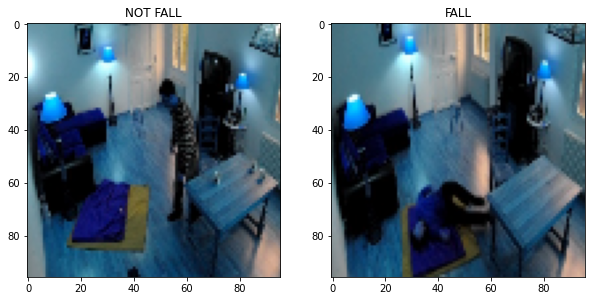

In [ ]:
# Home
plot_samples(train_images,train_labels)

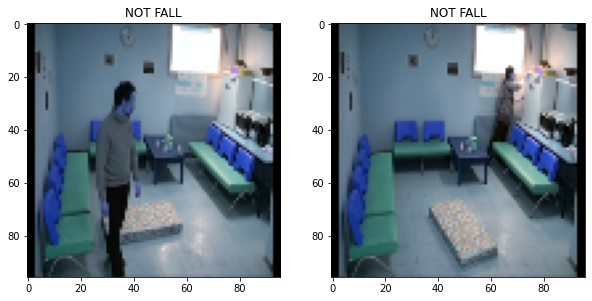

In [ ]:
# Coffee_room
plot_samples(train_images2,train_labels2)

# Fallnet

In [ ]:
def conv2d(filters: int, name):
    return Conv2D(filters=filters, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.), bias_regularizer=l2(0.), name=name)

In [ ]:
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, ReLU
from tensorflow.keras.activations import sigmoid
from tensorflow.keras.regularizers import l2

# fallnet architecture
def fallnet(X_train):
  model_input = Input(shape=(X_train.shape[1], X_train.shape[2], X_train.shape[3]), name='inputs')

  conv1 = conv2d(16, name='convoluton_1')(model_input)
  act1 = ReLU(name='activation_1')(conv1)
  pool1 = MaxPooling2D(pool_size=(2, 2), name='pooling_1')(act1)

  conv2 = conv2d(16, name='convolution_2')(pool1)
  act2 = ReLU(name='activation_2')(conv2)
  pool2 = MaxPooling2D(pool_size=(2, 2), name='pooling_2')(act2)

  conv3 = conv2d(32, name='convolution_3')(pool2)
  act3 = ReLU(name='activation_3')(conv3)
  pool3 = MaxPooling2D(pool_size=(2, 2), name='pooling_3')(act3)

  conv4 = conv2d(32, name='convolution_4')(pool3)
  act4 = ReLU(name='activation_4')(conv4)
  pool4 = MaxPooling2D(pool_size=(2, 2), name='pooling_4')(act4)

  conv5 = conv2d(64, name='convolition_5')(pool4)
  act5 = ReLU(name='activation_5')(conv5)
  pool5 = MaxPooling2D(pool_size=(2, 2), name='pooling_5')(act5)

  conv6 = conv2d(64, name='convolution_6')(pool5)
  act6 = ReLU(name='activation_6')(conv6)
  pool6 = MaxPooling2D(pool_size=(2, 2), name='pooling_6')(act6)

  flat = Flatten(name='flatten')(pool6)
  dense1 = Dense(32, name='dense1')(flat)
  output = Dense(1, activation='sigmoid', name='output')(dense1)

  model = Model(inputs=[model_input], outputs=[output])
  return model

In [ ]:
#model = fallnet(X_train)
#model2 = fallnet(X_train2)
model = fallnet(X_train_merged)

In [ ]:
def train(model,X_train,y_train,X_val,y_val,epoche):
  model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.005), loss='binary_crossentropy', metrics=['accuracy'])
  my_callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=2),
    tf.keras.callbacks.ModelCheckpoint(filepath='model.{epoch:02d}-{val_loss:.2f}.h5'),
  ] 
  history = model.fit(X_train,y_train, epochs = epoche, validation_data = (X_val, y_val),callbacks=my_callbacks)
  return history

In [ ]:
#history = train(model,X_train,y_train,X_val,y_val,20)
history = train(model,X_train_merged,y_train_merged,X_val_merged,y_val_merged,20)

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/20
1085/1085 [==============================] - 19s 9ms/step - loss: 0.2309 - accuracy: 0.9489 - val_loss: 0.0698 - val_accuracy: 0.9793
Epoch 2/20
1085/1085 [==============================] - 9s 8ms/step - loss: 0.0715 - accuracy: 0.9774 - val_loss: 0.0736 - val_accuracy: 0.9738
Epoch 3/20
1085/1085 [==============================] - 9s 8ms/step - loss: 0.0671 - accuracy: 0.9782 - val_loss: 0.0421 - val_accuracy: 0.9899
Epoch 4/20
1085/1085 [==============================] - 9s 8ms/step - loss: 0.0500 - accuracy: 0.9845 - val_loss: 0.0397 - val_accuracy: 0.9860
Epoch 5/20
1085/1085 [==============================] - 9s 8ms/step - loss: 0.0562 - accuracy: 0.9817 - val_loss: 0.1693 - val_accuracy: 0.9466
Epoch 6/20
1085/1085 [==============================] - 9s 8ms/step - loss: 0.0489 - accuracy: 0.9852 - val_loss: 0.0494 - val_accuracy: 0.9870


In [ ]:
#history2 = train(model2,X_train2,y_train2,X_val2,y_val2,15)

In [ ]:
def plot_history(history):
  # Sommario history della accuracy
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()

  # Sommario history della loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()

In [ ]:
plot_history(history)

In [ ]:
#plot_history(history2)

# Testing dei modelli

In [ ]:
print(type(test_images))
print(test_images.shape)

<class 'numpy.ndarray'>
(991, 120, 160, 3)


In [ ]:
predicted_labels = (model.predict(test_images) >= 0.5).astype('int64').flatten()

31/31 [==============================] - 0s 8ms/step


In [ ]:
predicted_labels2 = (model.predict(test_images2) >= 0.5).astype('int64').flatten()

91/91 [==============================] - 0s 4ms/step


In [ ]:
predicted_labels3 = (model.predict(test_images3) >= 0.5).astype('int64').flatten()

6/6 [==============================] - 0s 18ms/step


In [ ]:
def plot_results(test_images,predicted_labels,test_labels):
  row = 3
  col = 5
  fig, axes = plt.subplots(row, col, figsize=(16, 14))
  c = 0
  good_predicted = 0
  total_tested = 0
  for i in range(row):
      for j in range(col):
          axes[i][j].imshow(test_images[c])
          axes[i][j].set_title(f'Predicted: {get_label(predicted_labels[c])}', fontsize=8)
          axes[i][j].set_xlabel(f'Actual: {get_label(test_labels[c])}', fontsize=8)
          if get_label(predicted_labels[c]) == get_label(test_labels[c]):
            good_predicted += 1
          total_tested += 1
          c += 1

In [ ]:
plot_results(test_images,predicted_labels,test_labels)

In [ ]:
plot_results(test_images2,predicted_labels2,test_labels2)

In [ ]:
plot_results(test_images3,predicted_labels3,test_labels3)

In [ ]:
def get_accuracy(predicted_labels,test_labels):
  good_predicted = 0
  total_tested = 0
  for i in range (0,len(test_labels)):
    if get_label(predicted_labels[i]) == get_label(test_labels[i]):
      good_predicted += 1
    total_tested += 1
  print("Accuracy: "+str(good_predicted)+"/"+str(total_tested) + " ("+str(round(good_predicted*100/total_tested,2))+"%)")

In [ ]:
# Home
get_accuracy(predicted_labels,test_labels)

# Coffee_room
get_accuracy(predicted_labels2,test_labels2) 

# Cam0
get_accuracy(predicted_labels3,test_labels3) 

Accuracy: 903/991 (91.12%)
Accuracy: 2849/2901 (98.21%)
Accuracy: 164/169 (97.04%)


# Salvataggio modelli

Fallnet 128x96 (con un paio di video di lecture room e office):
- Accuracy: 903/991 (91.12%)
- Accuracy: 2849/2901 (98.21%)
- Accuracy: 164/169 (97.04%)


Fallnet 120x160:
- Home accuracy: 968/991 (97.67911200807265%)
- Coffee accuracy: 2830/2901 (97.55256807997242%)
- Cam0 accuracy: 156/169 (92.3076923076923%)

fallnet_home_coffee_cam_128_96:

- Accuracy: 932/991 (94.05%)
- Accuracy: 2814/2901 (97.0%)
- Accuracy: 163/169 (96.45%)

In [ ]:
model.save('drive/MyDrive/DatasetProf/fallnet_home_coffee_cam_lecture_office_128_96/model.h5') # 96% accuracy
model.save('drive/MyDrive/DatasetProf/fallnet_home_coffee_cam_lecture_office_128_96/')

# Loading del modello

In [ ]:
from tensorflow import keras
model = keras.models.load_model('drive/MyDrive/DatasetProf/fallnet120_160/')

In [ ]:
model.summary()

# Inferenza su video esterno al dataset (lecture room e office)

In [ ]:
import imageio

def video_to_frames(video_path,fx=96,fy=96,cut_half=True):
  vidcap = cv2.VideoCapture(video_path)
  success,image = vidcap.read()
  count = 0
  frames = []
  while success:
      cv2.imwrite("frame"+str(count)+".jpg", image)     # save frame as JPEG file      
      success,image = vidcap.read()

      
      #img = cv2.imread("frame"+str(count)+".jpg",cv2.IMREAD_COLOR)
      img = cv2.imread("frame"+str(count)+".jpg")

      if cut_half == True:
        #Prendo solo la metà destra del video
        height, width, channels = img.shape
        width_cutoff = width // 2
        img = img[:, width_cutoff:]
      
      img = cv2.resize(img, (fx,fy))
      frames.append(img)

      #print('Read a new frame: ', success)
      count += 1

  frames = np.array(frames,ndmin=4)
  return frames

In [ ]:
import cv2
import numpy as np

#frames = video_to_frames('drive/MyDrive/DatasetProf/video (1).avi')
#frames2 = video_to_frames('drive/MyDrive/FallDataset/Office/Videos/video (5).avi',cut_half=False,fx=160,fy=120) # fallnet120_160 lo predice bene
frames2 = video_to_frames('drive/MyDrive/FallDataset/Lecture_room/Videos/video (5).avi',cut_half=False,fx=128,fy=96)

In [ ]:
predicted_frame_labels = (model.predict(frames2) >= 0.5).astype('int64').flatten()
#predicted_frame_labels2 = (model2.predict(frames2) >= 0.5).astype('int64').flatten()

13/13 [==============================] - 0s 14ms/step


In [ ]:
from google.colab.patches import cv2_imshow
from IPython.display import clear_output
from time import sleep

def display_frames_results(frames,predicted_frame_labels):
  count = 0
  for img in frames:
    #clear_output()
    print(get_label(predicted_frame_labels[count]))
    cv2_imshow(img)
    count += 1

NOT FALL


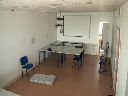

NOT FALL


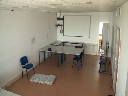

NOT FALL


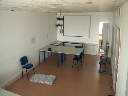

NOT FALL


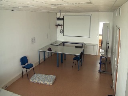

NOT FALL


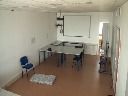

NOT FALL


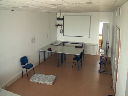

NOT FALL


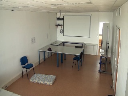

NOT FALL


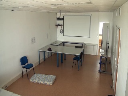

NOT FALL


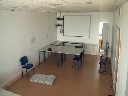

NOT FALL


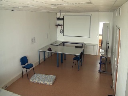

NOT FALL


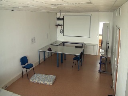

NOT FALL


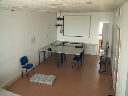

NOT FALL


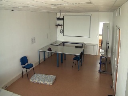

NOT FALL


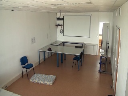

NOT FALL


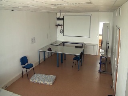

NOT FALL


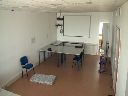

NOT FALL


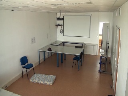

NOT FALL


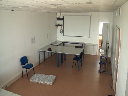

NOT FALL


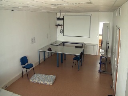

NOT FALL


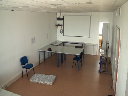

NOT FALL


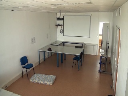

NOT FALL


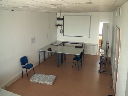

NOT FALL


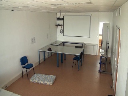

NOT FALL


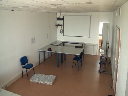

NOT FALL


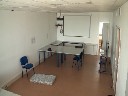

NOT FALL


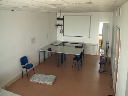

NOT FALL


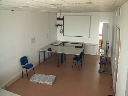

NOT FALL


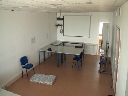

NOT FALL


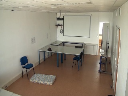

NOT FALL


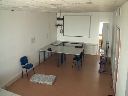

NOT FALL


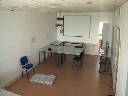

NOT FALL


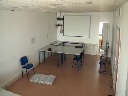

NOT FALL


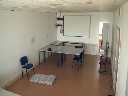

NOT FALL


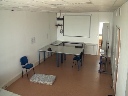

NOT FALL


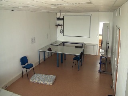

NOT FALL


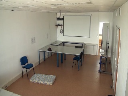

NOT FALL


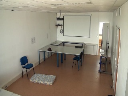

NOT FALL


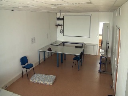

NOT FALL


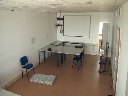

NOT FALL


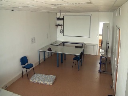

NOT FALL


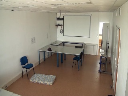

NOT FALL


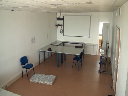

NOT FALL


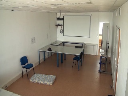

NOT FALL


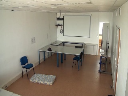

NOT FALL


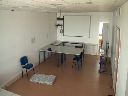

NOT FALL


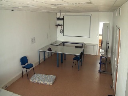

NOT FALL


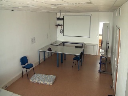

NOT FALL


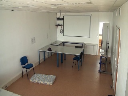

NOT FALL


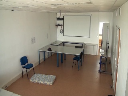

NOT FALL


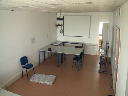

NOT FALL


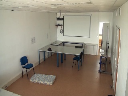

NOT FALL


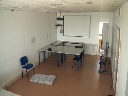

NOT FALL


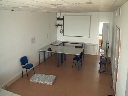

NOT FALL


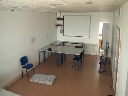

NOT FALL


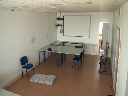

NOT FALL


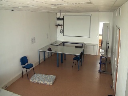

NOT FALL


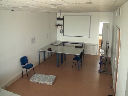

NOT FALL


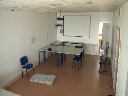

NOT FALL


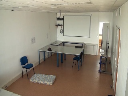

NOT FALL


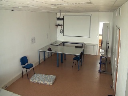

NOT FALL


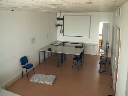

NOT FALL


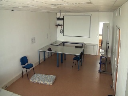

NOT FALL


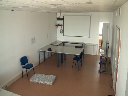

NOT FALL


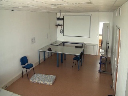

NOT FALL


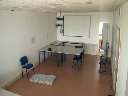

NOT FALL


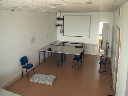

NOT FALL


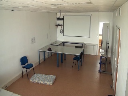

NOT FALL


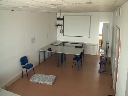

NOT FALL


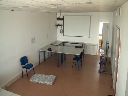

NOT FALL


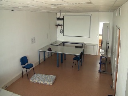

NOT FALL


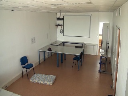

NOT FALL


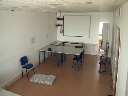

NOT FALL


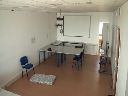

NOT FALL


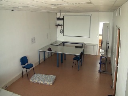

NOT FALL


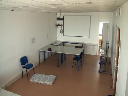

NOT FALL


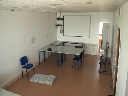

NOT FALL


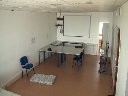

NOT FALL


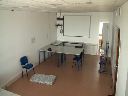

NOT FALL


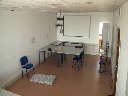

NOT FALL


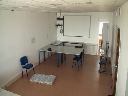

NOT FALL


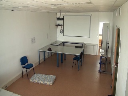

NOT FALL


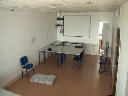

NOT FALL


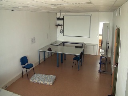

NOT FALL


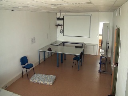

NOT FALL


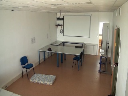

NOT FALL


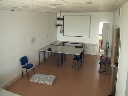

NOT FALL


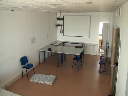

NOT FALL


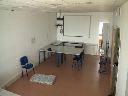

NOT FALL


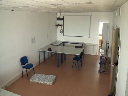

NOT FALL


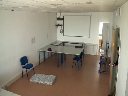

NOT FALL


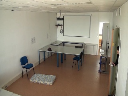

NOT FALL


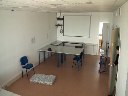

NOT FALL


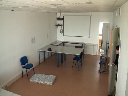

NOT FALL


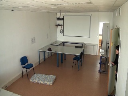

NOT FALL


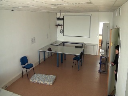

NOT FALL


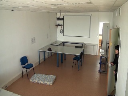

NOT FALL


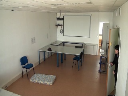

NOT FALL


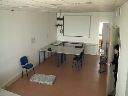

NOT FALL


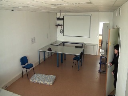

NOT FALL


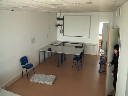

NOT FALL


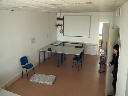

NOT FALL


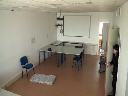

NOT FALL


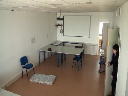

NOT FALL


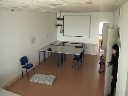

NOT FALL


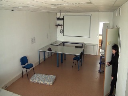

NOT FALL


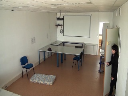

NOT FALL


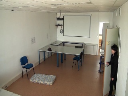

NOT FALL


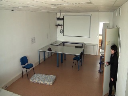

NOT FALL


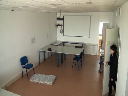

NOT FALL


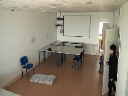

NOT FALL


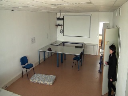

NOT FALL


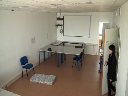

NOT FALL


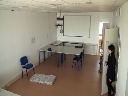

NOT FALL


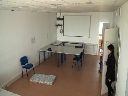

NOT FALL


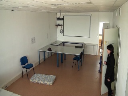

NOT FALL


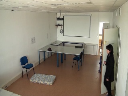

NOT FALL


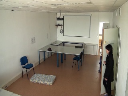

NOT FALL


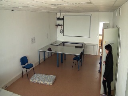

NOT FALL


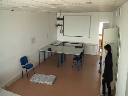

NOT FALL


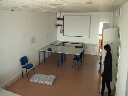

NOT FALL


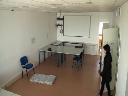

NOT FALL


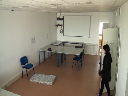

NOT FALL


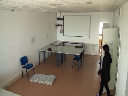

NOT FALL


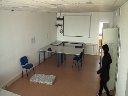

NOT FALL


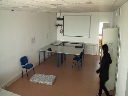

NOT FALL


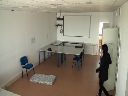

NOT FALL


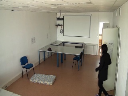

NOT FALL


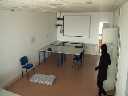

NOT FALL


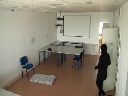

NOT FALL


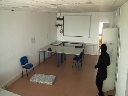

NOT FALL


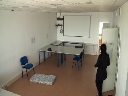

NOT FALL


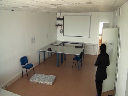

NOT FALL


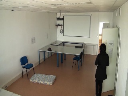

NOT FALL


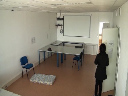

NOT FALL


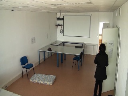

NOT FALL


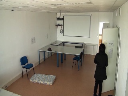

NOT FALL


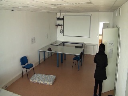

NOT FALL


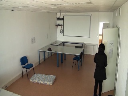

NOT FALL


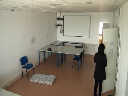

NOT FALL


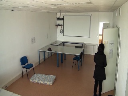

NOT FALL


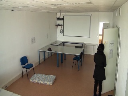

NOT FALL


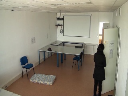

NOT FALL


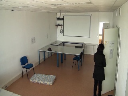

NOT FALL


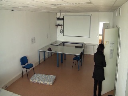

NOT FALL


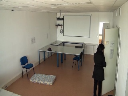

NOT FALL


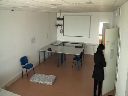

NOT FALL


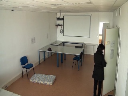

NOT FALL


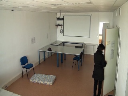

NOT FALL


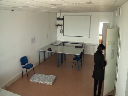

NOT FALL


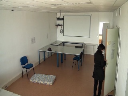

NOT FALL


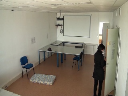

NOT FALL


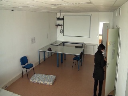

NOT FALL


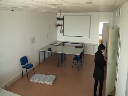

NOT FALL


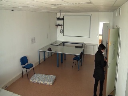

NOT FALL


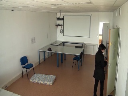

NOT FALL


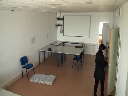

NOT FALL


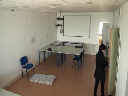

NOT FALL


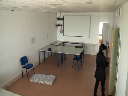

NOT FALL


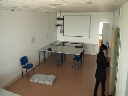

NOT FALL


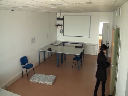

NOT FALL


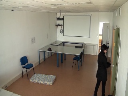

NOT FALL


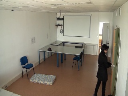

NOT FALL


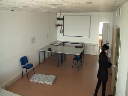

NOT FALL


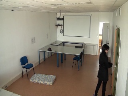

NOT FALL


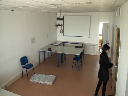

NOT FALL


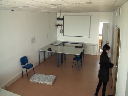

NOT FALL


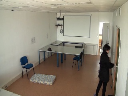

NOT FALL


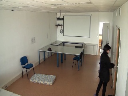

NOT FALL


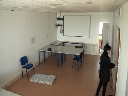

NOT FALL


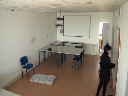

NOT FALL


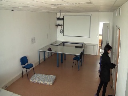

NOT FALL


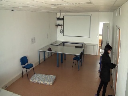

NOT FALL


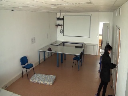

NOT FALL


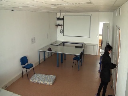

NOT FALL


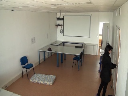

NOT FALL


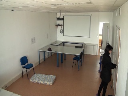

NOT FALL


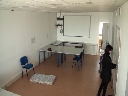

NOT FALL


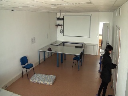

NOT FALL


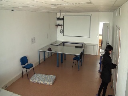

NOT FALL


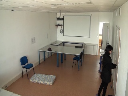

NOT FALL


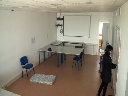

NOT FALL


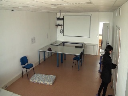

NOT FALL


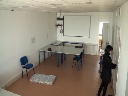

NOT FALL


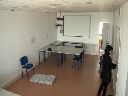

NOT FALL


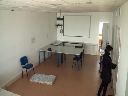

NOT FALL


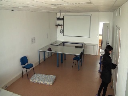

NOT FALL


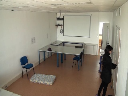

NOT FALL


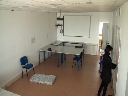

NOT FALL


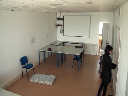

NOT FALL


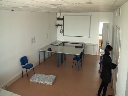

NOT FALL


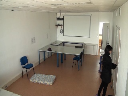

NOT FALL


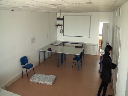

NOT FALL


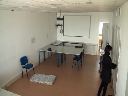

NOT FALL


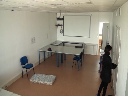

NOT FALL


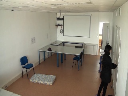

NOT FALL


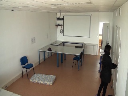

NOT FALL


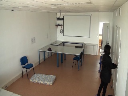

NOT FALL


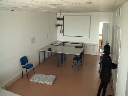

NOT FALL


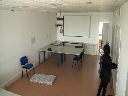

NOT FALL


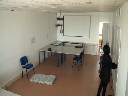

NOT FALL


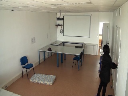

NOT FALL


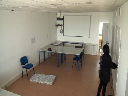

NOT FALL


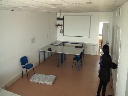

NOT FALL


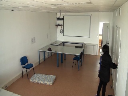

NOT FALL


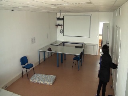

NOT FALL


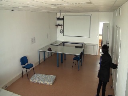

NOT FALL


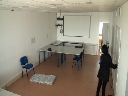

NOT FALL


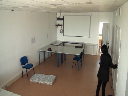

NOT FALL


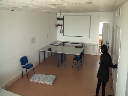

NOT FALL


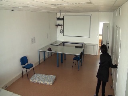

NOT FALL


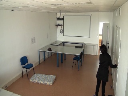

NOT FALL


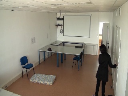

NOT FALL


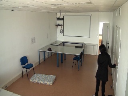

NOT FALL


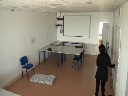

NOT FALL


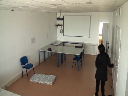

NOT FALL


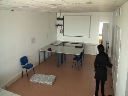

NOT FALL


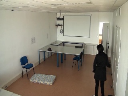

NOT FALL


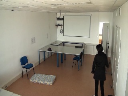

NOT FALL


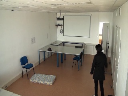

NOT FALL


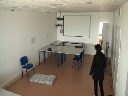

NOT FALL


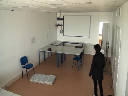

NOT FALL


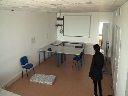

NOT FALL


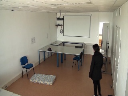

NOT FALL


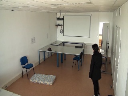

NOT FALL


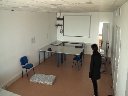

NOT FALL


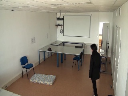

NOT FALL


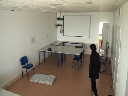

NOT FALL


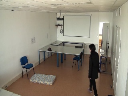

NOT FALL


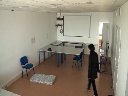

NOT FALL


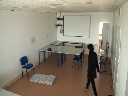

NOT FALL


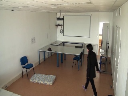

NOT FALL


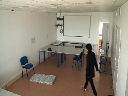

NOT FALL


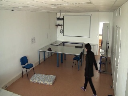

NOT FALL


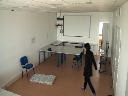

NOT FALL


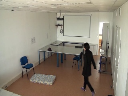

NOT FALL


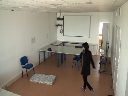

NOT FALL


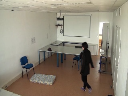

NOT FALL


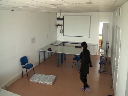

NOT FALL


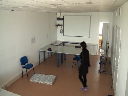

NOT FALL


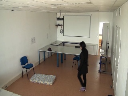

NOT FALL


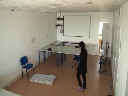

NOT FALL


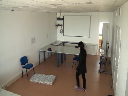

NOT FALL


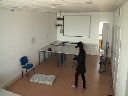

NOT FALL


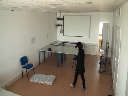

NOT FALL


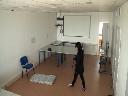

NOT FALL


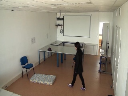

NOT FALL


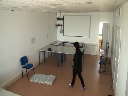

NOT FALL


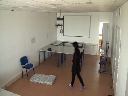

NOT FALL


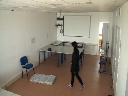

NOT FALL


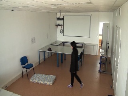

NOT FALL


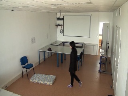

NOT FALL


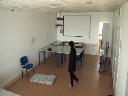

NOT FALL


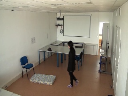

NOT FALL


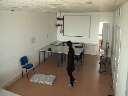

NOT FALL


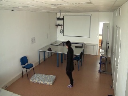

NOT FALL


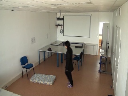

NOT FALL


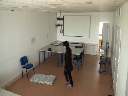

NOT FALL


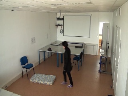

NOT FALL


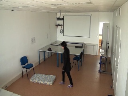

NOT FALL


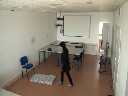

NOT FALL


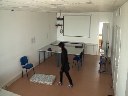

NOT FALL


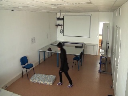

NOT FALL


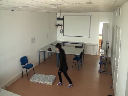

NOT FALL


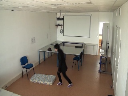

NOT FALL


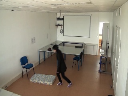

NOT FALL


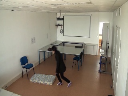

NOT FALL


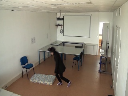

FALL


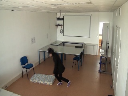

FALL


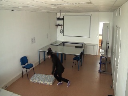

NOT FALL


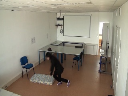

NOT FALL


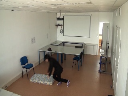

NOT FALL


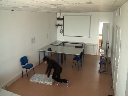

FALL


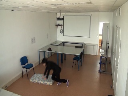

FALL


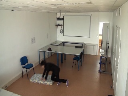

FALL


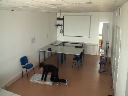

FALL


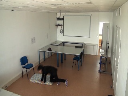

FALL


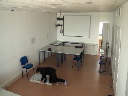

FALL


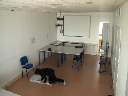

FALL


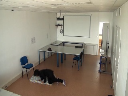

FALL


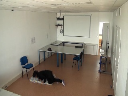

FALL


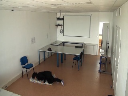

FALL


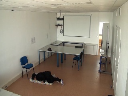

FALL


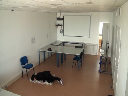

FALL


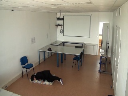

FALL


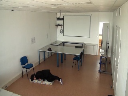

FALL


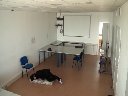

FALL


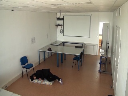

FALL


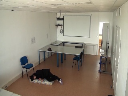

FALL


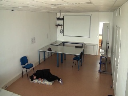

FALL


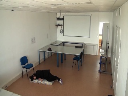

FALL


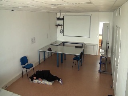

FALL


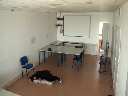

FALL


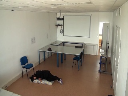

FALL


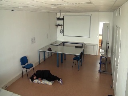

FALL


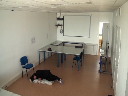

FALL


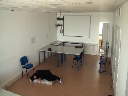

FALL


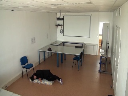

FALL


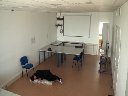

FALL


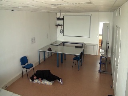

FALL


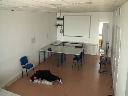

FALL


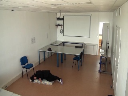

FALL


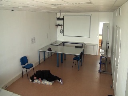

FALL


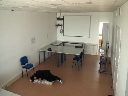

FALL


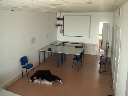

FALL


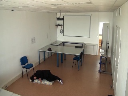

FALL


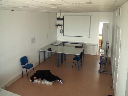

FALL


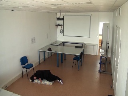

FALL


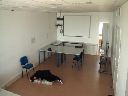

FALL


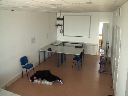

FALL


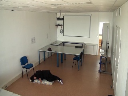

FALL


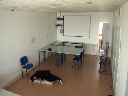

FALL


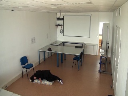

FALL


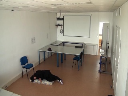

FALL


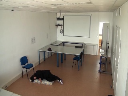

FALL


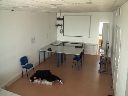

FALL


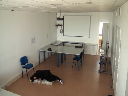

FALL


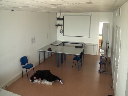

FALL


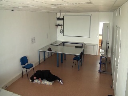

FALL


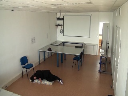

FALL


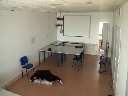

FALL


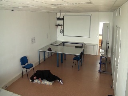

FALL


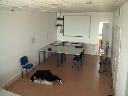

FALL


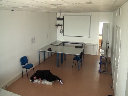

FALL


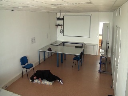

FALL


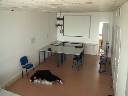

FALL


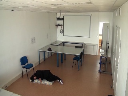

FALL


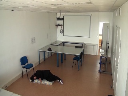

FALL


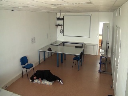

FALL


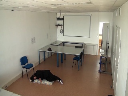

FALL


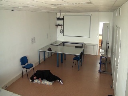

FALL


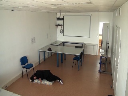

FALL


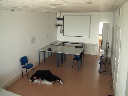

FALL


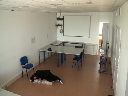

FALL


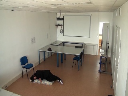

FALL


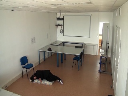

FALL


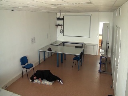

FALL


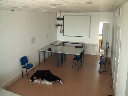

FALL


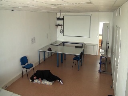

FALL


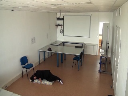

FALL


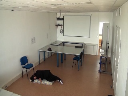

FALL


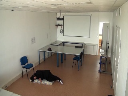

FALL


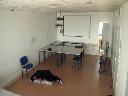

FALL


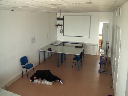

FALL


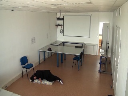

FALL


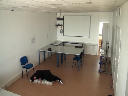

FALL


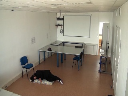

FALL


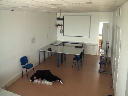

FALL


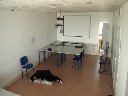

FALL


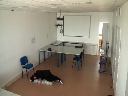

FALL


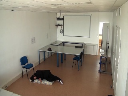

FALL


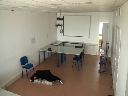

FALL


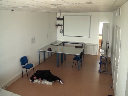

FALL


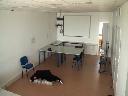

FALL


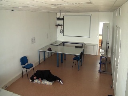

FALL


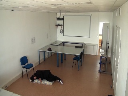

FALL


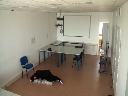

FALL


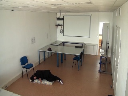

FALL


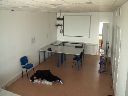

FALL


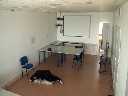

FALL


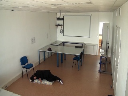

FALL


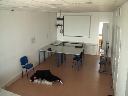

FALL


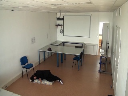

FALL


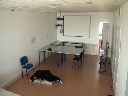

FALL


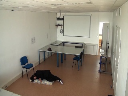

FALL


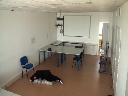

FALL


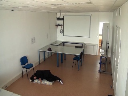

FALL


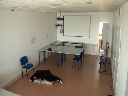

FALL


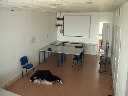

FALL


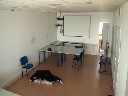

FALL


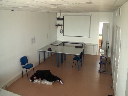

FALL


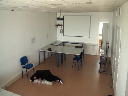

FALL


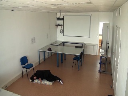

FALL


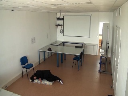

FALL


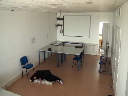

FALL


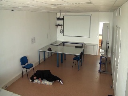

FALL


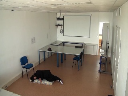

FALL


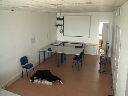

FALL


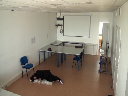

FALL


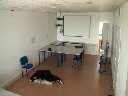

FALL


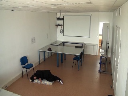

FALL


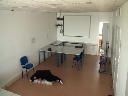

FALL


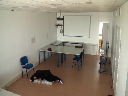

FALL


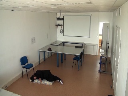

FALL


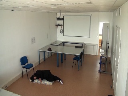

FALL


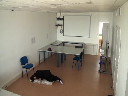

FALL


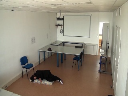

FALL


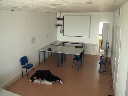

FALL


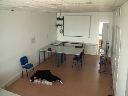

FALL


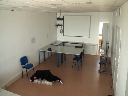

In [ ]:
#display_frames_results(frames2,predicted_frame_labels)
display_frames_results(frames2,predicted_frame_labels)

In [ ]:
#display_frames_results(frames2,predicted_frame_labels2)

In [ ]:
!ls -l drive/MyDrive/DatasetProf/Home_merged/train | wc -l

# VGG16

In [ ]:
X_train_merged.shape

In [ ]:
X_train_merged.shape[1]
X_train_merged.shape[2]
X_train_merged.shape[3]

3

In [ ]:
from keras.models import Sequential
from keras.applications.vgg16 import VGG16
from keras.layers import Dense, InputLayer, Dropout, Flatten, Activation
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D, MaxPooling2D
from tensorflow import keras
from keras.utils import to_categorical
from keras.layers import Conv2D,MaxPool2D

def create_model(X_train_merged):
  model = Sequential()

  model.add(Conv2D(input_shape=(X_train_merged.shape[1],X_train_merged.shape[2],X_train_merged.shape[3]),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
  model.add(Conv2D(filters=8,kernel_size=(3,3),padding="same", activation="relu"))
  model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

  model.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

  model.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

  model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

  model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

  model.add(Flatten())
  model.add(Dense(units=32,activation="relu"))
  #model.add(Dense(units=2048,activation="relu"))
  model.add(Dense(units=1, activation="sigmoid"))
  return model

In [ ]:
from keras.optimizers import Adam

model = create_model(X_train_merged)
opt = Adam(lr=0.001)
model.compile(optimizer=opt, loss=keras.losses.BinaryCrossentropy, metrics=['accuracy'])

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
model.summary()

In [ ]:
history = train(model,X_train_merged,y_train_merged,X_val_merged,y_val_merged,20)

Epoch 1/20
934/934 [==============================] - 35s 36ms/step - loss: 4.5254 - accuracy: 0.7218 - val_loss: 0.5901 - val_accuracy: 0.7230
Epoch 2/20
934/934 [==============================] - 29s 31ms/step - loss: 0.5909 - accuracy: 0.7231 - val_loss: 0.5904 - val_accuracy: 0.7230
Epoch 3/20
934/934 [==============================] - 27s 29ms/step - loss: 0.5910 - accuracy: 0.7231 - val_loss: 0.5902 - val_accuracy: 0.7230


In [ ]:
predicted_labels = (model.predict(test_images) >= 0.5).astype('int64').flatten() #home
predicted_labels2 = (model.predict(test_images2) >= 0.5).astype('int64').flatten() #coffee
predicted_labels3 = (model.predict(test_images3) >= 0.5).astype('int64').flatten() #cam0
get_accuracy(predicted_labels,test_labels)
get_accuracy(predicted_labels2,test_labels2)
get_accuracy(predicted_labels3,test_labels3)

6/6 [==============================] - 0s 42ms/step
Accuracy: 810/991 (81.73562058526741%)
Accuracy: 2776/2901 (95.69114098586694%)
Accuracy: 114/169 (67.45562130177515%)


In [ ]:
plot_results(test_images,predicted_labels,test_labels)

In [ ]:
plot_results(test_images2,predicted_labels2,test_labels2)

In [ ]:
plot_results(test_images3,predicted_labels3,test_labels3)

In [ ]:
model.save('drive/MyDrive/DatasetProf/fallnet.h5')
model.save('drive/MyDrive/DatasetProf/fallnet/')

# Train con Home1 e Coffee1

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import os
import keras

In [ ]:
data_path = "drive/MyDrive/DatasetProf/Home_merged"
data_path2 = "drive/MyDrive/DatasetProf/Coffee_merged"

In [ ]:
def read_dataset(path,delimiter):
  df = pd.read_csv(path,sep=delimiter,index_col='images')
  df = df.dropna()
  return df

In [ ]:
# Home
df_train = read_dataset(data_path+'/train_labels.csv',delimiter=",")
print(df_train.shape)

# Coffee room
df_train2 = read_dataset(data_path2+'/train_labels.csv',delimiter=",")
print(df_train2.shape)

(13506, 1)
(21022, 1)


In [ ]:
# Home
test_df = read_dataset(data_path+'/test_labels.csv',delimiter=",")
print(test_df.shape)

# Coffee room
test_df2 = read_dataset(data_path2+'/test_labels.csv',delimiter=",")
print(test_df2.shape)

(991, 1)
(2901, 1)


In [ ]:
def stack_data2(dataset_folder,df_train,test_df):
  train_images = []
  train_labels = []
  test_images = []
  test_labels = []

  for folder in os.listdir(data_path):
      folder_path = os.path.join(data_path, folder)
      if folder == 'train':
          print('train')
          for file in os.listdir(folder_path):
              try:
                num = int(file.split("o")[1].split("_")[0])
              except:
                print(file)
                continue
              if num < 29 and file.endswith(".jpg"):
                  try:
                    img_path = os.path.join(folder_path, file)
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, (96,96))
                    train_images.append(img)
                    train_labels.append(df_train.loc[file, 'labels'])
                  except:
                    pass
                    #print("File: "+file)

      elif folder == 'test':
            print("test")
            for file in os.listdir(folder_path):
                if file.endswith(".jpg"):
                    try:
                      img_path = os.path.join(folder_path, file)
                      img = cv2.imread(img_path)
                      img = cv2.resize(img, (96,96))
                      test_images.append(img)
                      test_labels.append(test_df.loc[file, 'labels'])
                    except:
                      pass
                      #print("File: "+file)
      else:
        pass
            
  train_images = np.array(train_images)
  train_labels = np.array(train_labels)
  test_images = np.array(test_images)
  test_labels = np.array(test_labels)
  print('Shape of stacked train images:', train_images.shape)
  print('Shape of train labels:', train_labels.shape)
  print('Shape of stacked test images:', test_images.shape)
  print('Shape of test labels:', test_labels.shape)
  return train_images, train_labels,test_images,test_labels

In [ ]:
print("Home")
train_images,train_labels,test_images,test_labels = stack_data2(data_path,df_train,test_df)
print("Coffee")
train_images2,train_labels2,test_images2,test_labels2 = stack_data2(data_path2,df_train2,test_df2)

Home
test
train
.DS_Store
Shape of stacked train images: (6712, 96, 96, 3)
Shape of train labels: (6712,)
Shape of stacked test images: (991, 96, 96, 3)
Shape of test labels: (991,)
Coffee
test
train
.DS_Store
Shape of stacked train images: (6712, 96, 96, 3)
Shape of train labels: (5863,)
Shape of stacked test images: (991, 96, 96, 3)
Shape of test labels: (0,)


In [ ]:
# Home fino al video 28, Coffee fino al video 46
print("Home")
print(len(train_images),len(train_labels),len(test_images),len(test_labels))
print("Coffee")
print(len(train_images2),len(train_labels2),len(test_images2),len(test_labels2))

Home
6712 6712 463 463
Coffee
6712 5863 463 0
